# **Deterministic Model for the Energy Production**

The aim of this notebook is to create a baseline model for the deterministc part of the solar energy production time series, treated here as a cross-sectional problem. Furthermore, we will de-trend and de-seasonal the data.

## 0 - Set up

### 0.1 - Loading relevant packages

In [1]:
#for handling the data
import numpy as np
import pandas as pd

#for visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec
sns.set() # set seaborn as default style

#for handling time
from datetime import datetime as dt

#for the modelling
from catboost import CatBoostRegressor, Pool
from xgboost import XGBRegressor

#for feature selection
from sklearn.feature_selection import SelectFromModel, SelectKBest, r_regression

#for model evaluation
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score, mean_absolute_percentage_error, make_scorer

#ensemble methods
from sklearn.pipeline import Pipeline

#miscellania
import scipy.stats as ss
from timeit import default_timer as timer
import json
import warnings
warnings.filterwarnings('ignore')

# Set the style of seaborn
sns.set(style="whitegrid")

RSEED = 42

### 0.2 - User-defined functions

#### Cramers correlation between two categorical variables

In [2]:
def cramers_corrected_stat(df,cat_col1,cat_col2):
    """
    This function spits out corrected Cramer's correlation statistic
    between two categorical columns of a dataframe 
    """
    crosstab = pd.crosstab(df[cat_col1],df[cat_col2])
    chi_sqr = ss.chi2_contingency(crosstab)[0]
    n = crosstab.sum().sum()
    r,k = crosstab.shape
    phi_sqr_corr = max(0, chi_sqr/n - ((k-1)*(r-1))/(n-1))    
    r_corr = r - ((r-1)**2)/(n-1)
    k_corr = k - ((k-1)**2)/(n-1)
    
    result = np.sqrt(phi_sqr_corr / min( (k_corr-1), (r_corr-1)))
    return round(result,3)

#### Anova p-value for test of no correlation between a numerical and a categorical variables

In [3]:
def anova_pvalue(df,cat_col,num_col):
    """
    This function spits out the anova p-value (probability of no correlation) 
    between a categorical column and a numerical column of a dataframe
    """
    CategoryGroupLists = df.groupby(cat_col)[num_col].apply(list)
    AnovaResults = ss.f_oneway(*CategoryGroupLists)
    p_value = round(AnovaResults[1],6)
    return p_value

#### Evaluation metrics 

In [4]:
def metrics(model_name, model, X, y, log_scale = False, scale_factor = None):
    """
    returns a dataframe with the model evaluation metrics 
    for a given trained model
    """
    # predictions on test data
    yp = model.predict(X)
    
    # model evaluation metrics
    metrics = [
        mean_absolute_error,
        root_mean_squared_error,
        r2_score
    ]
    
    if scale_factor is None:
        if log_scale:
            scores  = [[round(metric(y,np.expm1(yp)),6)] for metric in metrics]
        else:
            scores  = [[round(metric(y,yp),6)] for metric in metrics]
            
    else:
        if log_scale:
            scores  = [[round(metric(y,np.expm1(yp)*scale_factor),6)] for metric in metrics]
        else:
            scores  = [[round(metric(y,yp*scale_factor),6)] for metric in metrics]
    
    # metric dataframe
    df_metric = pd.DataFrame(
        data=dict(
            zip([metric.__name__ for metric in metrics], scores)
        ), 
        index=[model_name]
    )
    return df_metric

#### MAE with exponentials

In [5]:
class MAE_EXP:
   
    def is_max_optimal(self):
        return False # lower is better

    def evaluate(self, approxes, target, weight):
 
        y_true = np.exp(np.array(target))
        y_pred = np.exp(np.array(approxes))
        w = np.array(weight)
        
        
        score = np.mean(np.abs(y_true - y_pred)*w)
        return score, 1

    def get_final_error(self, error, weight):
        return error

#### Get targets and features

In [6]:
def get_feats_and_target(df):
    
    datetime_feats = df.select_dtypes(include=["datetime64"]).columns.to_list()
    cat_feats = df.select_dtypes(include=["category"]).columns.to_list()
    num_cols = df.select_dtypes(include=["float64", "int64"]).columns.to_list()
    
    target = [elem for elem in num_cols if ("target" in elem)&("lag" not in elem)]
    num_feats = [elem for elem in num_cols if elem not in target]
    
    if "prediction_unit_id" in num_feats:
        num_feats.remove("prediction_unit_id")
    
    cat_num_feats = cat_feats + num_feats
        
    return cat_feats, num_feats, cat_num_feats, target

#### Train/validation split

In [7]:
def my_train_val_split(df, date):

    train_cond = pd.to_datetime(df['date']) < pd.to_datetime(date)
    val_cond = pd.to_datetime(df['date']) >= pd.to_datetime(date)
    
    df_train = df[train_cond]
    df_val = df[val_cond]
    
    return df_train, df_val

#### `is_business` split

In [8]:
def is_business_split(df):

    is_business_cond = df.is_business == 1 
    
    df_buss = df[is_business_cond].copy()
    df_buss.drop(columns = 'is_business', inplace = True)
    df_prvt = df[~is_business_cond].copy()
    df_prvt.drop(columns = 'is_business', inplace = True)
    
    return df_buss, df_prvt

## 1 - Loading the data

In [9]:
data_df = pd.read_csv('../data/data_production.csv', parse_dates = ["datetime", "date"])

In [10]:
pred_unit_id_dict = pd.read_csv('../data/prediction_unit_id_dictionary.csv')

In [11]:
cat_cols = [
    "county",
    "is_business",
    "product_type",
    "hour",
    "month",
    "is_weekend",
    "is_holiday",
    "is_school_holiday",
    "is_population_over_100k"
]

data_df[cat_cols] = data_df[cat_cols].astype("category")

In [12]:
data_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 818519 entries, 0 to 818518
Data columns (total 53 columns):
 #   Column                              Non-Null Count   Dtype         
---  ------                              --------------   -----         
 0   county                              818519 non-null  category      
 1   is_business                         818519 non-null  category      
 2   product_type                        818519 non-null  category      
 3   datetime                            818519 non-null  datetime64[ns]
 4   date                                818519 non-null  datetime64[ns]
 5   solar_azimuth                       818519 non-null  float64       
 6   solar_altitude                      818519 non-null  float64       
 7   hour                                818519 non-null  category      
 8   month                               818519 non-null  category      
 9   is_weekend                          818519 non-null  category      
 10  day_numb

In [13]:
data_df.head()

,county,is_business,product_type,datetime,date,solar_azimuth,solar_altitude,hour,month,is_weekend,...,target_6_days_lag_flip_is_cons,target_7_days_lag,target_7_days_lag_flip_is_cons,target_14_days_lag,target_14_days_lag_flip_is_cons,target_28_days_lag,target_28_days_lag_flip_is_cons,target_42_days_lag,target_42_days_lag_flip_is_cons,target
0,0,0,1,2021-12-22,2021-12-22,172.478077,-53.978407,0,12,0,...,278.872,0.091,304.499,0.000,443.099,0.404,279.132,1.138,242.419,0.009
1,0,0,2,2021-12-22,2021-12-22,172.478077,-53.978407,0,12,0,...,31.599,0.000,32.074,0.000,45.366,0.000,45.721,0.000,27.973,0.000
2,0,0,3,2021-12-22,2021-12-22,172.478077,-53.978407,0,12,0,...,1399.250,0.031,1446.090,0.002,2224.608,1.124,1444.792,0.005,1301.150,0.000
3,0,1,0,2021-12-22,2021-12-22,172.478077,-53.978407,0,12,0,...,117.100,0.000,112.000,0.000,190.200,0.000,114.100,0.000,114.300,0.000
4,0,1,1,2021-12-22,2021-12-22,172.478077,-53.978407,0,12,0,...,827.490,0.000,851.599,0.000,1120.541,0.000,838.699,0.000,725.434,0.000


In [14]:
business_ids = pred_unit_id_dict[pred_unit_id_dict['is_business']==1]['prediction_unit_id'].tolist()
private_ids = pred_unit_id_dict[pred_unit_id_dict['is_business']==0]['prediction_unit_id'].tolist()

##  2 - Modelling

### 2.1 - Target pre-processing

In [15]:
data_df["log1p_target_per_installed_capacity"] = np.log1p(data_df.target/data_df.installed_capacity)

### 2.2 - Splitting features and target

We first separate the different types of features we have in our dataset, namely *datetime*, *categorical* and *numerical features*.

In [16]:
cat_feats, num_feats, cat_num_feats, target = get_feats_and_target(data_df)

In [17]:
cat_feats.remove('is_business')
cat_num_feats.remove('is_business')

The *datetime*-type features are irrelevant here as they have been enconded into *categorical*- and *numerical*-type features. 

In [18]:
data_train_df, data_val_df = my_train_val_split(data_df, date = '2023-01-01')

In [19]:
data_buss_df, data_prvt_df = is_business_split(data_df)
data_train_buss_df, data_train_prvt_df = is_business_split(data_train_df)
data_val_buss_df, data_val_prvt_df = is_business_split(data_val_df)

In [20]:
X_buss = data_buss_df[cat_num_feats].copy()
y_buss = data_buss_df[['datetime'] + target].copy()

X_train_buss = data_train_buss_df[cat_num_feats].copy()
y_train_buss = data_train_buss_df[['datetime'] + target].copy()

X_val_buss = data_val_buss_df[cat_num_feats].copy()
y_val_buss = data_val_buss_df[['datetime'] + target].copy()

In [21]:
X_prvt = data_prvt_df[cat_num_feats].copy()
y_prvt = data_prvt_df[['datetime'] + target].copy()

X_train_prvt = data_train_prvt_df[cat_num_feats].copy()
y_train_prvt = data_train_prvt_df[['datetime'] + target].copy()

X_val_prvt = data_val_prvt_df[cat_num_feats].copy()
y_val_prvt = data_val_prvt_df[['datetime'] + target].copy()

### 2.2 - Correlations

#### Correlations amongst the numerical features

To analyse the correlations amongst the *numerical features*, we will employ __[*Pearson's correlation*](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient)__ coefficient.

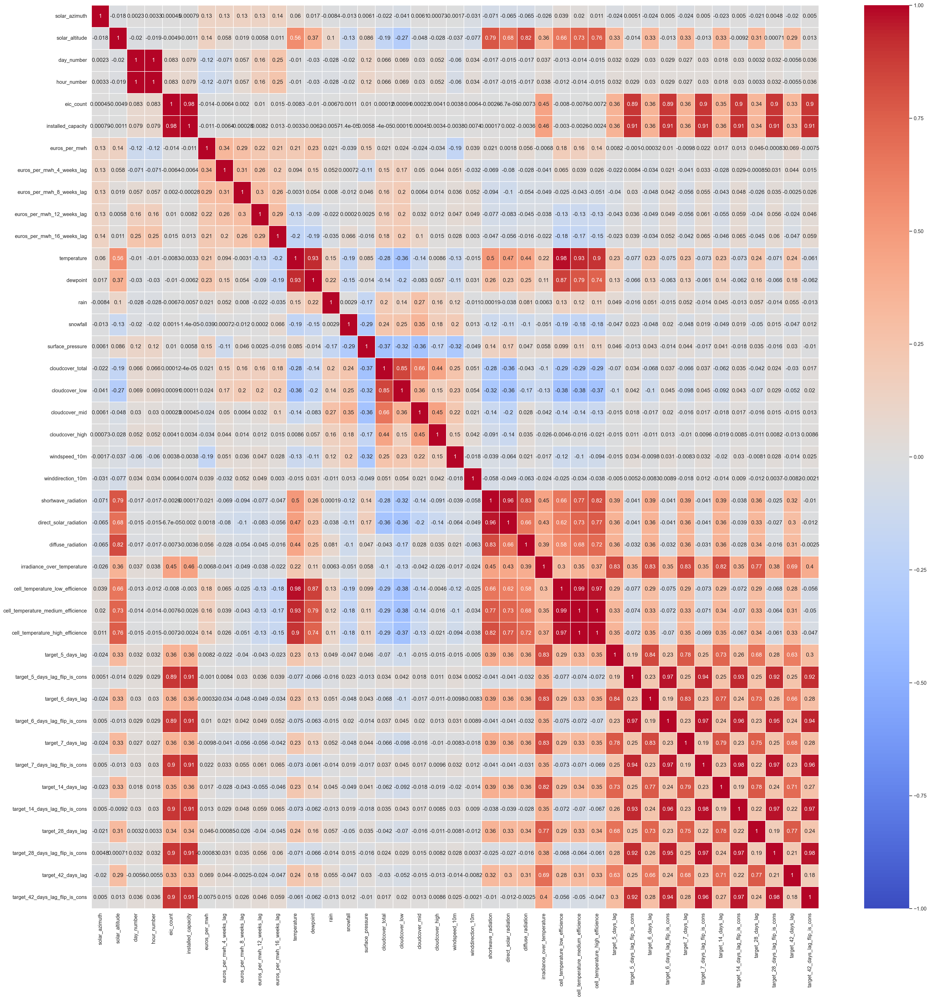

In [22]:
# Pearson correlation heatmap

plt.figure(figsize=(35,35),dpi=200)
sns.heatmap(data=X_buss[num_feats].corr(method = 'pearson', 
                                         numeric_only = True), 
            cmap='coolwarm', linecolor='white', linewidth=1, 
            annot=True, vmin=-1, vmax=1)
plt.show()

#### Correlation amongst numerical features targets for business

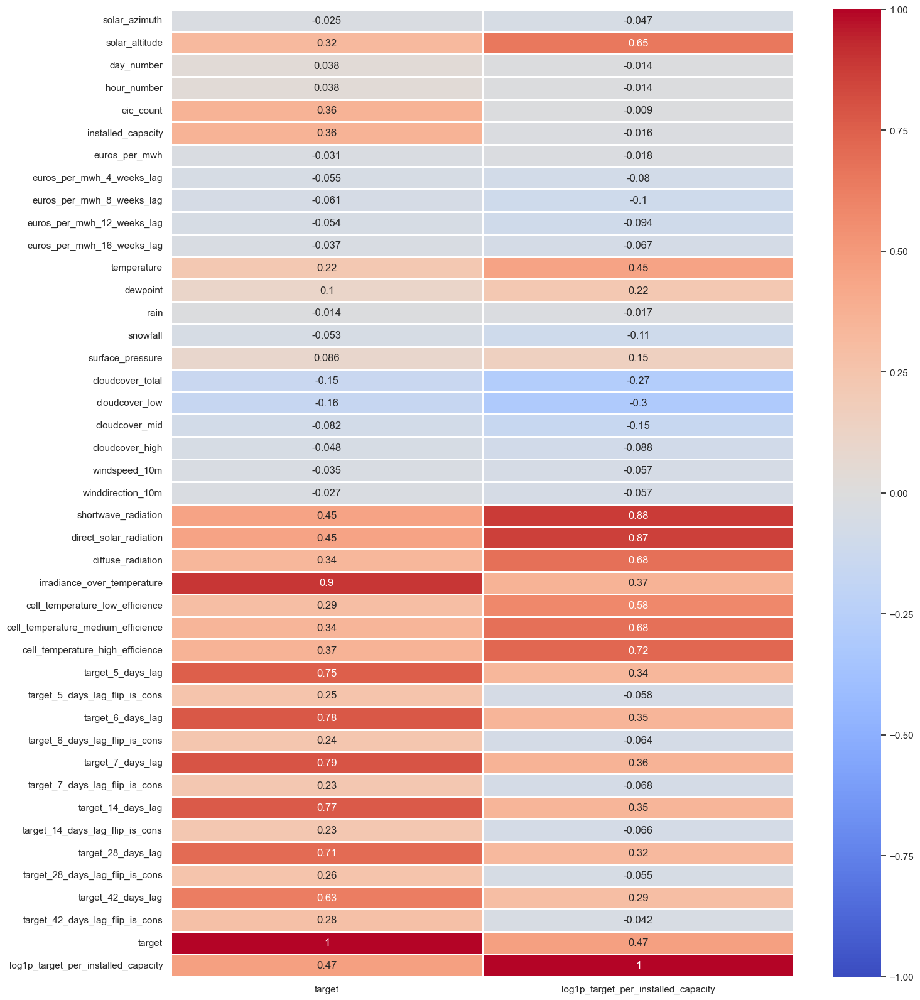

In [23]:
# Pearson correlation heatmap

plt.figure(figsize=(16,20),dpi=100)
sns.heatmap(
    data=data_buss_df[num_feats + target].corr(method = 'pearson', 
                                 numeric_only = True)[target],
    cmap='coolwarm',
    linecolor='white',
    linewidth=1,
    annot=True,
    vmin=-1,
    vmax=1
);
#plt.savefig('correlations_targets_features_production.png')

In [24]:
select_feats_linear_buss = SelectKBest(r_regression, k = "all").fit(X_buss[num_feats], y_buss.log1p_target_per_installed_capacity)
df_select_feats_linear_buss = pd.DataFrame({"features" : select_feats_linear_buss.get_feature_names_out(num_feats), 
                                            "score" : select_feats_linear_buss.scores_})
df_select_feats_linear_buss["score"] = df_select_feats_linear_buss.score.apply(lambda x: np.abs(x))
df_select_feats_linear_buss.sort_values(by = "score", ascending = False)[:45]

,features,score
22,shortwave_radiation,0.875262
23,direct_solar_radiation,0.866680
28,cell_temperature_high_efficience,0.722297
24,diffuse_radiation,0.683612
27,cell_temperature_medium_efficience,0.680825
1,solar_altitude,0.648720
26,cell_temperature_low_efficience,0.583946
11,temperature,0.447446
25,irradiance_over_temperature,0.365227
33,target_7_days_lag,0.359454


#### Correlation amongst numerical features targets for private

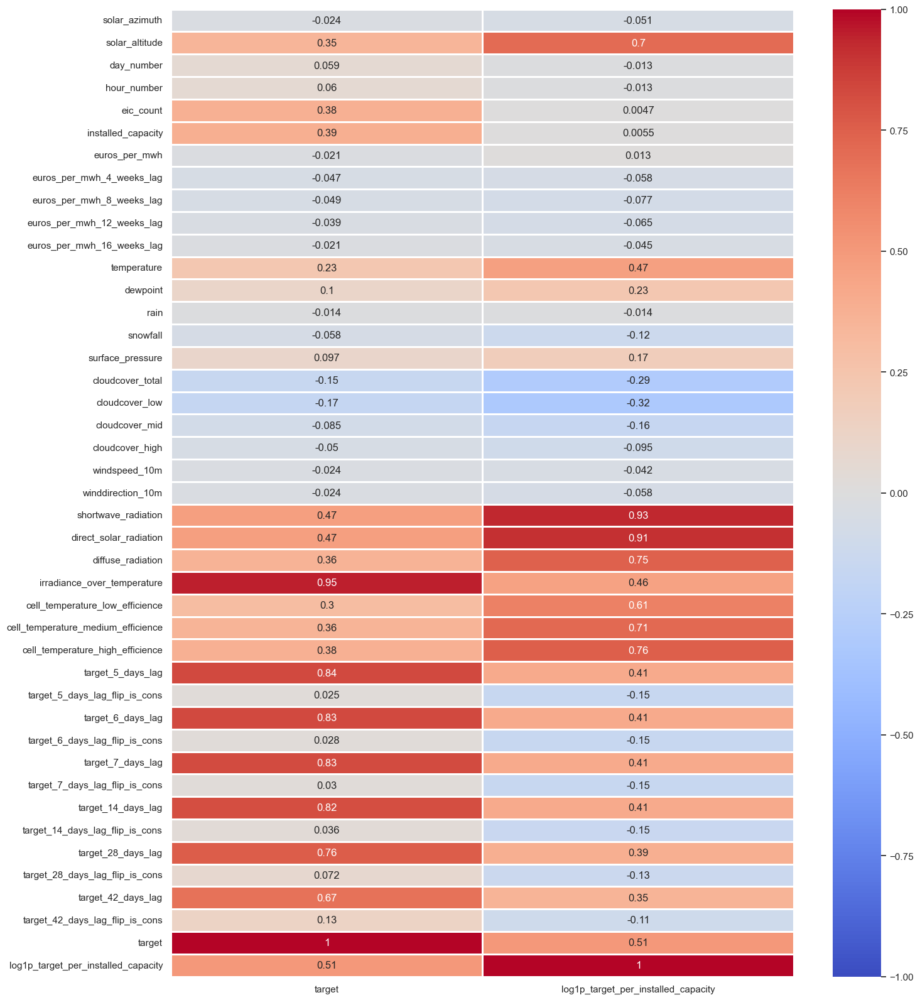

In [25]:
# Pearson correlation heatmap

plt.figure(figsize=(16,20),dpi=100)
sns.heatmap(
    data=data_prvt_df[num_feats + target].corr(method = 'pearson', 
                                 numeric_only = True)[target],
    cmap='coolwarm',
    linecolor='white',
    linewidth=1,
    annot=True,
    vmin=-1,
    vmax=1
);
#plt.savefig('correlations_targets_features_production.png')

In [26]:
select_feats_linear_prvt = SelectKBest(r_regression, k = "all").fit(X_prvt[num_feats], y_prvt.log1p_target_per_installed_capacity)
df_select_feats_linear_prvt = pd.DataFrame({"features" : select_feats_linear_prvt.get_feature_names_out(num_feats), 
                                            "score" : select_feats_linear_prvt.scores_})
df_select_feats_linear_prvt["score"] = df_select_feats_linear_prvt.score.apply(lambda x: np.abs(x))
df_select_feats_linear_prvt.sort_values(by = "score", ascending = False)[:45]

,features,score
22,shortwave_radiation,0.930996
23,direct_solar_radiation,0.911208
28,cell_temperature_high_efficience,0.757550
24,diffuse_radiation,0.747003
27,cell_temperature_medium_efficience,0.713186
1,solar_altitude,0.703417
26,cell_temperature_low_efficience,0.610404
11,temperature,0.466858
25,irradiance_over_temperature,0.458642
29,target_5_days_lag,0.412183


#### Correlations amongst the categorical features

To analyse the correlations amongst the *categorical features*, we employ __[*Cramér's V correlation*](https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V)__ coefficient.

In [27]:
# create a dictionary of Cramer's correlation 
cramer_v_corr = dict(
    zip(
        cat_feats,
        [[cramers_corrected_stat(X_buss,f1,f2) for f2 in cat_feats] for f1 in cat_feats]
    )
)

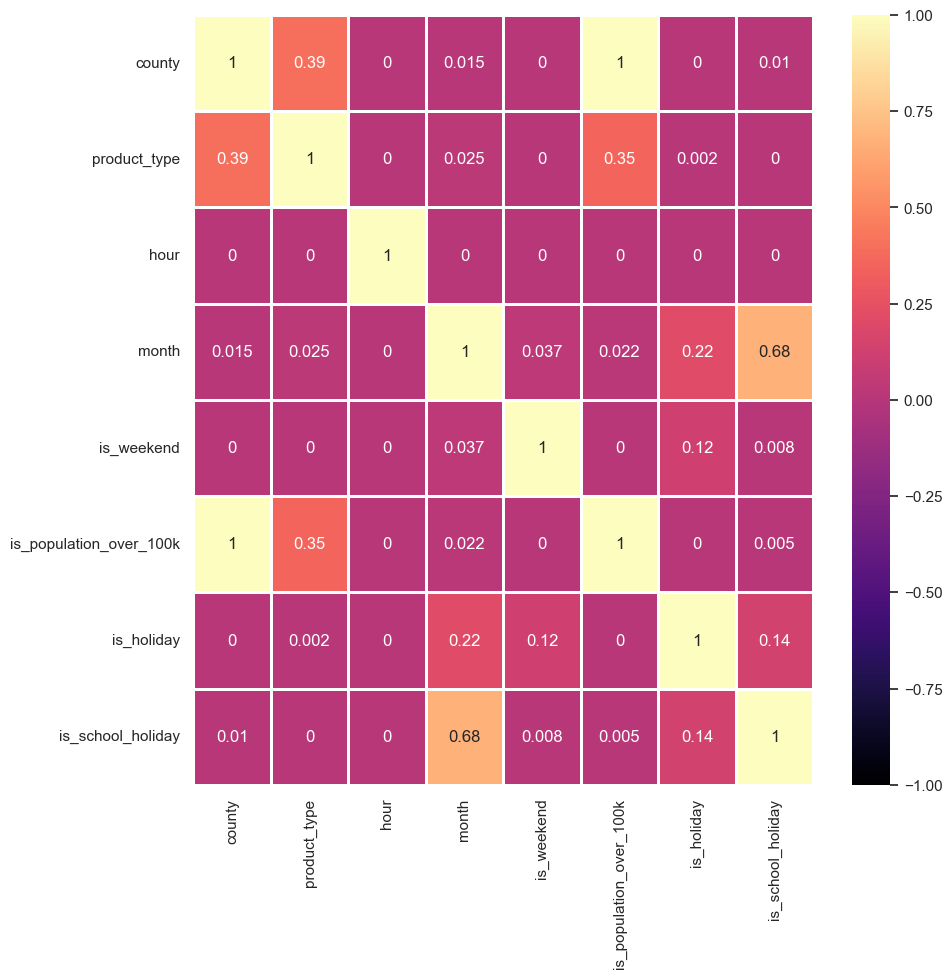

In [28]:
# Cramer correlation heatmap

plt.figure(figsize=(10,10),dpi=100)
sns.heatmap(data=pd.DataFrame(data=cramer_v_corr,index=cat_feats),
            cmap='magma',
            linecolor='white',
            linewidth=1,
            annot=True,
            vmin=-1,
            vmax=1
           );

#### Correlations amongst categorical features and targets for business

To analyse the correlations amongst the categorical features and target, we now employ the __[*ANOVA p-value*](https://en.wikipedia.org/wiki/Analysis_of_variance)__ method. This method computes the probablility of the categorical and numerical values to **not** be correlated.

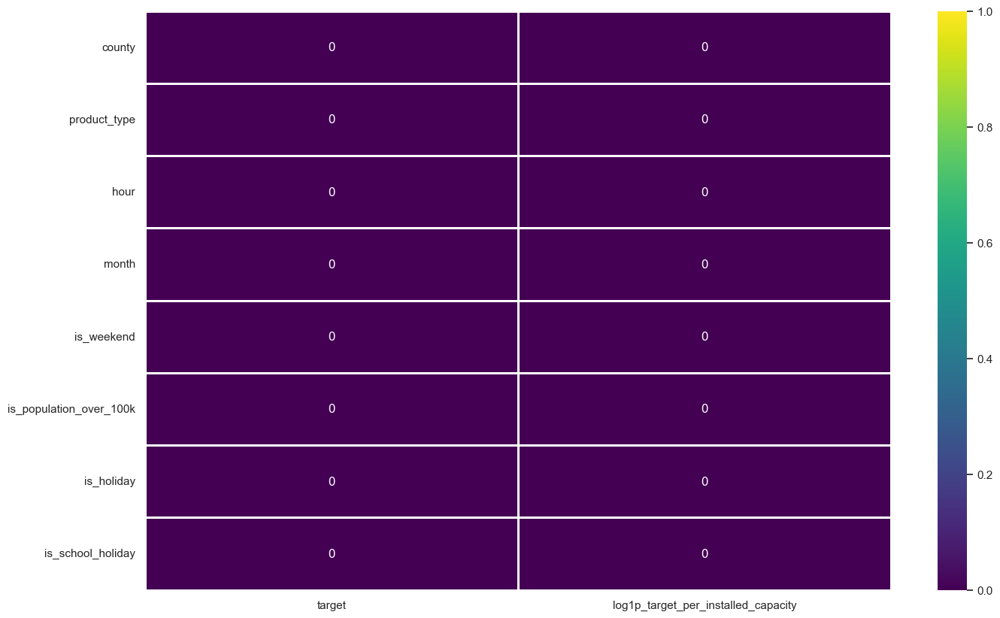

In [29]:
# create a dictionary of anova p-value

anova_pvalue_dict = dict(
    zip(
        cat_feats,
        [[anova_pvalue(data_train_buss_df,f1,f2) for f2 in target] for f1 in cat_feats]
    )
)

# heatmap of anova p-values

plt.figure(figsize=(16,10),dpi=100)
sns.heatmap(data=pd.DataFrame(data=anova_pvalue_dict,index=target).T,
            cmap='viridis',
            linecolor='white',
            linewidth=1,
            annot=True,
            vmin=0,
            vmax=1
           );

#### Correlations amongst categorical features and targets for private

To analyse the correlations amongst the categorical features and target, we now employ the __[*ANOVA p-value*](https://en.wikipedia.org/wiki/Analysis_of_variance)__ method. This method computes the probablility of the categorical and numerical values to **not** be correlated.

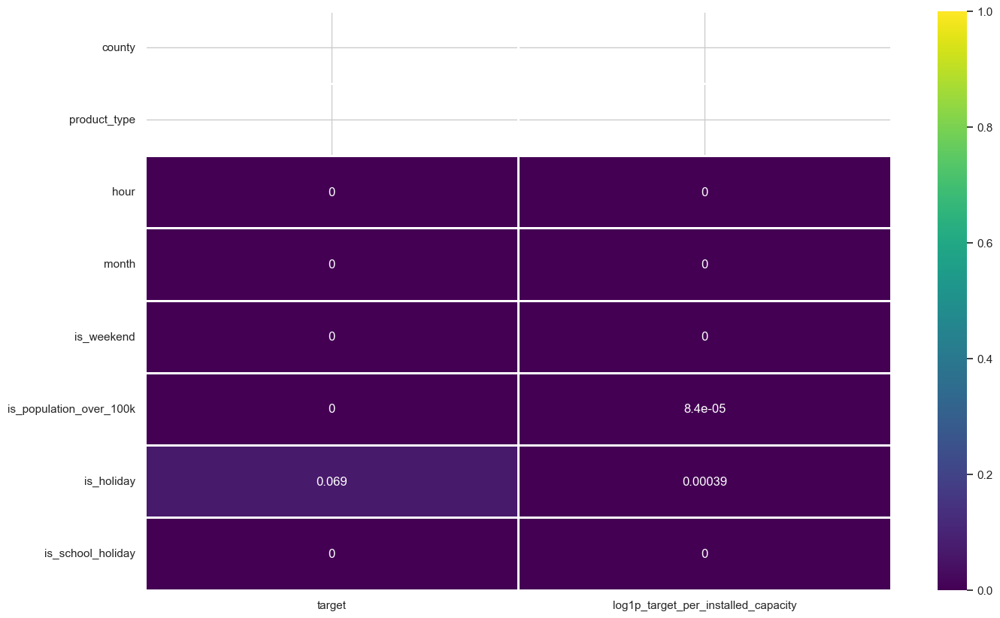

In [30]:
# create a dictionary of anova p-value

anova_pvalue_dict = dict(
    zip(
        cat_feats,
        [[anova_pvalue(data_train_prvt_df,f1,f2) for f2 in target] for f1 in cat_feats]
    )
)

# heatmap of anova p-values

plt.figure(figsize=(16,10),dpi=100)
sns.heatmap(data=pd.DataFrame(data=anova_pvalue_dict,index=target).T,
            cmap='viridis',
            linecolor='white',
            linewidth=1,
            annot=True,
            vmin=0,
            vmax=1
           );

### 2.4 - CatBoostRegressor models for business production with validation set

#### CatBoost for business production scaled by `installed_capacity`

In [31]:
ignored_feats = [
   'diffuse_radiation',
    'installed_capacity', 
   "dewpoint",
   "cloudcover_low",
    'euros_per_mwh',
    "snowfall",
    "day_number",
    "is_holiday",
    "is_school_holiday",
    "is_population_over_100k",
    "target_42_days_lag",      
    "target_42_days_lag_flip_is_cons"
]

cat_boost_params = {'loss_function' : 'RMSE',
                    'eval_metric' : MAE_EXP(),
                    'use_best_model' : True,
                    'random_seed' : RSEED,
                    'cat_features' : cat_feats,
                    'ignored_features' : ignored_feats,
                    'silent' : True
                   }


weight_buss = np.array(X_buss.installed_capacity)
weight_train_buss = np.array(X_train_buss.installed_capacity)
weight_val_buss = np.array(X_val_buss.installed_capacity)

train_data_buss = Pool(data = X_train_buss, 
                           label = y_train_buss.log1p_target_per_installed_capacity, 
                           weight = weight_train_buss, 
                           cat_features = cat_feats)


eval_data_buss = Pool(data = X_val_buss, 
                           label = y_val_buss.log1p_target_per_installed_capacity, 
                           weight = weight_val_buss, 
                           cat_features = cat_feats)

cat_boost = CatBoostRegressor(**cat_boost_params)

In [32]:
cat_boost_buss = cat_boost.fit(train_data_buss, eval_set = eval_data_buss)

In [33]:
y_buss['target_predicted'] = np.expm1(cat_boost_buss.predict(X_buss))*weight_buss
y_train_buss['target_predicted'] = np.expm1(cat_boost_buss.predict(X_train_buss))*weight_train_buss
y_val_buss['target_predicted'] = np.expm1(cat_boost_buss.predict(X_val_buss))*weight_val_buss

In [34]:
metrics('CatBoost on train set', cat_boost_buss, X_train_buss, 
        y_train_buss.target, log_scale = True, scale_factor = weight_train_buss)

,mean_absolute_error,root_mean_squared_error,r2_score
CatBoost on train set,22.821806,77.689943,0.941754


In [35]:
metrics('CatBoost on validation set', cat_boost_buss, X_val_buss, 
        y_val_buss.target, log_scale = True, scale_factor = weight_val_buss)

,mean_absolute_error,root_mean_squared_error,r2_score
CatBoost on validation set,36.727003,150.214406,0.901282


In [36]:
metrics('CatBoost on full set', cat_boost_buss, X_buss, 
        y_buss.target, log_scale = True, scale_factor = weight_buss)

,mean_absolute_error,root_mean_squared_error,r2_score
CatBoost on full set,26.714899,103.263332,0.923136


In [37]:
cont_mae_full_buss = mean_absolute_error(y_buss.target, y_buss.target_predicted)*data_buss_df.target.size/(2*data_df.target.size)
cont_mae_val_buss = mean_absolute_error(y_val_buss.target, y_val_buss.target_predicted)*data_val_buss_df.target.size/(2*data_val_df.target.size)

print("Contribution to the total MAE:", cont_mae_full_buss)
print("Contribution to the MAE on validation set:", cont_mae_val_buss)

Contribution to the total MAE: 7.2127572821819275
Contribution to the MAE on validation set: 9.939433309321743


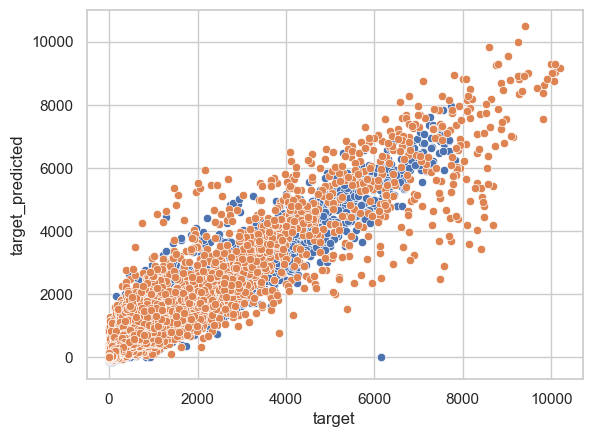

In [38]:
sns.scatterplot(x = y_train_buss.target, y = y_train_buss.target_predicted)
sns.scatterplot(x = y_val_buss.target, y = y_val_buss.target_predicted)
plt.show()

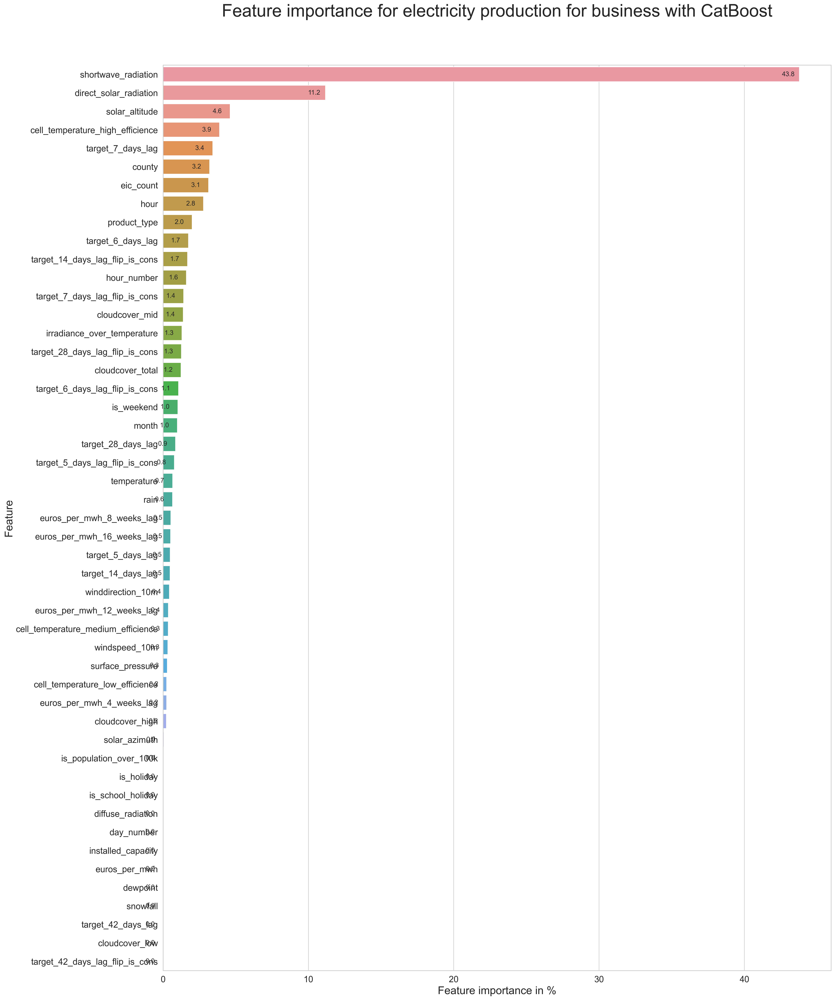

In [39]:
sorted_feature_importance = cat_boost_buss.feature_importances_.argsort()[::-1]
feat_importance_df = pd.DataFrame(data = {'feature' : X_buss.columns[sorted_feature_importance].to_numpy(), 
                                          'feature_importance' : cat_boost_buss.feature_importances_[sorted_feature_importance]})
plt.figure(figsize=(22,30),dpi=300)
ax = sns.barplot(data = feat_importance_df, 
            x = 'feature_importance', 
            y = 'feature', 
)
plt.title('Feature importance for electricity production for business with CatBoost', fontsize = 32, y = 1.05)
plt.xlabel('Feature importance in %', fontsize = 20)
plt.ylabel('Feature', fontsize = 20)
plt.tick_params(labelsize = 16)
plt.bar_label(ax.containers[0], fmt='%.1f', padding = -32)
plt.rcParams['font.size'] = 15
plt.show()

In [40]:
y_buss['noise'] = y_buss.target - y_buss.target_predicted
y_train_buss['noise'] = y_train_buss.target - y_train_buss.target_predicted
y_val_buss['noise'] = y_val_buss.target - y_val_buss.target_predicted

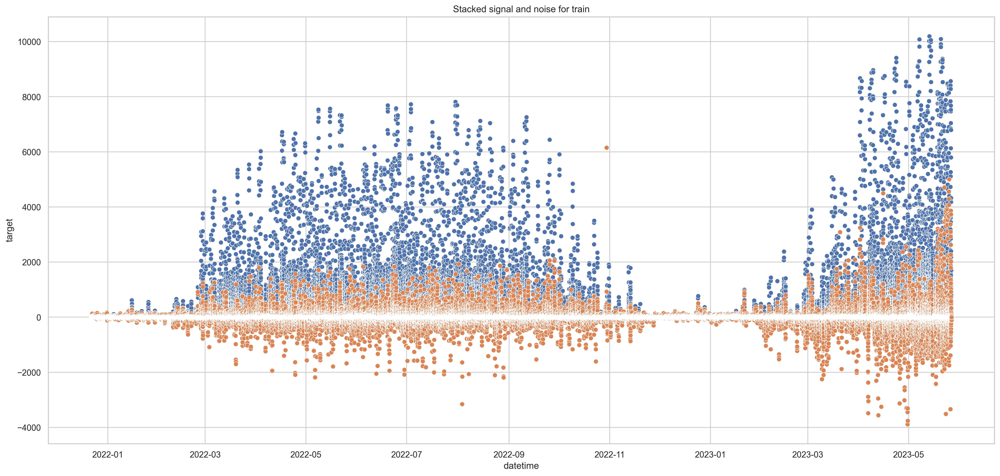

In [41]:
aux_df = y_buss[['datetime', 'target', 'noise']].copy()

plt.figure(figsize=(22,10),dpi=300)
plt.title('Stacked signal and noise for train')
sns.scatterplot(aux_df, x = 'datetime', y = 'target')
sns.scatterplot(aux_df, x = 'datetime', y = 'noise')
plt.show()

### 2.5 - CatBoostRegressor models for private production

#### CatBoost for private production scaled by `installed_capacity`

In [42]:
ignored_feats = [
#    'diffuse_radiation',
    'installed_capacity', 
#    "dewpoint",
#    "cloudcover_low",
    'euros_per_mwh',
    "day_number",
    "is_holiday",
    "is_school_holiday",
    "is_weekend",
    "is_population_over_100k",
    "target_42_days_lag",      
    "target_42_days_lag_flip_is_cons"
]

cat_boost_params = {'loss_function' : 'RMSE',
                    'eval_metric' : MAE_EXP(),
                    'use_best_model' : True,
                    'random_seed' : RSEED,
                    'cat_features' : cat_feats,
                    'ignored_features' : ignored_feats,
                    'silent' : True
                   }


weight_train_prvt = np.array(X_train_prvt.installed_capacity)
weight_val_prvt = np.array(X_val_prvt.installed_capacity)

train_data_prvt = Pool(data = X_train_prvt, 
                           label = y_train_prvt.log1p_target_per_installed_capacity, 
                           weight = weight_train_prvt, 
                           cat_features = cat_feats)


eval_data_prvt = Pool(data = X_val_prvt, 
                           label = y_val_prvt.log1p_target_per_installed_capacity, 
                           weight = weight_val_prvt, 
                           cat_features = cat_feats)

cat_boost = CatBoostRegressor(**cat_boost_params)

In [43]:
cat_boost_prvt = cat_boost.fit(train_data_prvt, eval_set = eval_data_prvt)

In [44]:
y_prvt['target_predicted'] = np.expm1(cat_boost_prvt.predict(X_prvt))*X_prvt.installed_capacity
y_train_prvt['target_predicted'] = np.expm1(cat_boost_prvt.predict(X_train_prvt))*X_train_prvt.installed_capacity
y_val_prvt['target_predicted'] = np.expm1(cat_boost_prvt.predict(X_val_prvt))*X_val_prvt.installed_capacity

In [45]:
metrics('CatBoost on train set', cat_boost_prvt, X_train_prvt, 
        y_train_prvt.target, log_scale = True, scale_factor = X_train_prvt.installed_capacity)

,mean_absolute_error,root_mean_squared_error,r2_score
CatBoost on train set,22.798417,81.019206,0.947749


In [46]:
metrics('CatBoost on validation set', cat_boost_prvt, X_val_prvt, 
        y_val_prvt.target, log_scale = True, scale_factor = X_val_prvt.installed_capacity)

,mean_absolute_error,root_mean_squared_error,r2_score
CatBoost on validation set,36.270199,135.982661,0.949114


In [47]:
metrics('CatBoost on full set', cat_boost_prvt, X_prvt, 
        y_prvt.target, log_scale = True, scale_factor = X_prvt.installed_capacity)

,mean_absolute_error,root_mean_squared_error,r2_score
CatBoost on full set,26.550774,99.429579,0.9486


In [48]:
cont_mae_full_prvt = mean_absolute_error(y_prvt.target, y_prvt.target_predicted)*data_prvt_df.target.size/(2*data_df.target.size)
cont_mae_val_prvt = mean_absolute_error(y_val_prvt.target, y_val_prvt.target_predicted)*data_val_prvt_df.target.size/(2*data_val_df.target.size)

print("Contribution to the total MAE:", cont_mae_full_prvt)
print("Contribution to the MAE on validation set:", cont_mae_val_prvt)

Contribution to the total MAE: 6.106941718331403
Contribution to the MAE on validation set: 8.319291146082229


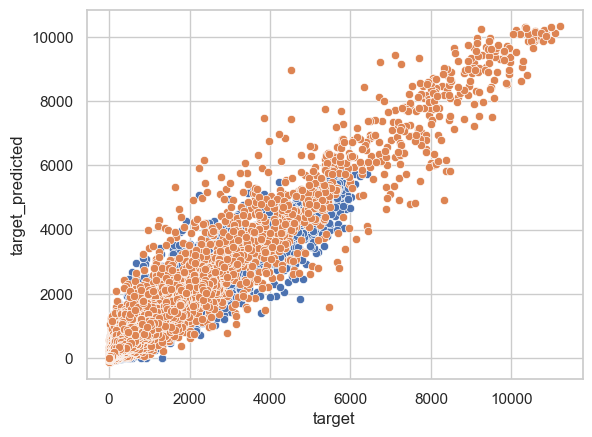

In [49]:
sns.scatterplot(x = y_train_prvt.target, y = y_train_prvt.target_predicted)
sns.scatterplot(x = y_val_prvt.target, y = y_val_prvt.target_predicted)
plt.show()

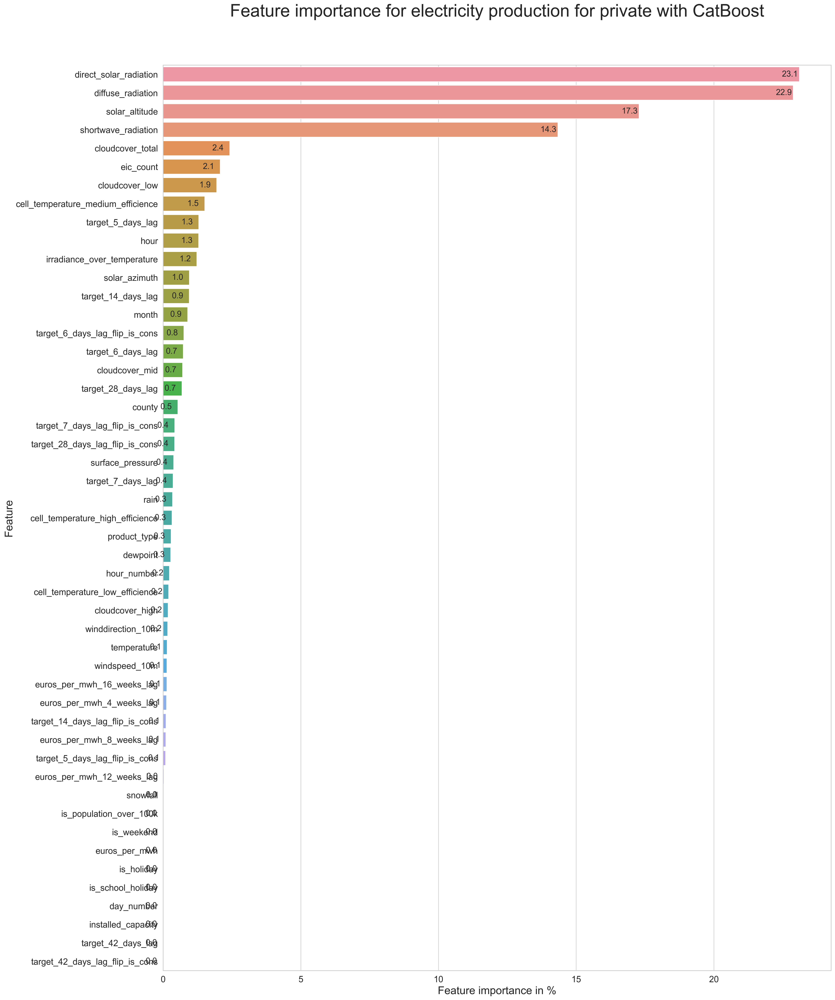

In [50]:
sorted_feature_importance = cat_boost_prvt.feature_importances_.argsort()[::-1]
feat_importance_df = pd.DataFrame(data = {'feature' : X_prvt.columns[sorted_feature_importance].to_numpy(), 
                                          'feature_importance' : cat_boost_prvt.feature_importances_[sorted_feature_importance]})
plt.figure(figsize=(22,30),dpi=300)
ax = sns.barplot(data = feat_importance_df, 
            x = 'feature_importance', 
            y = 'feature', 
)
plt.title('Feature importance for electricity production for private with CatBoost', fontsize = 32, y = 1.05)
plt.xlabel('Feature importance in %', fontsize = 20)
plt.ylabel('Feature', fontsize = 20)
plt.tick_params(labelsize = 16)
plt.bar_label(ax.containers[0], fmt='%.1f', padding = -32)
plt.rcParams['font.size'] = 15
#plt.savefig('feature_importances_cons_prvt.png', transparent = True)
plt.show()

In [51]:
top_10_feat_imporyance = feat_importance_df['feature_importance'][:20].sum()
print(f'Cummulated importance feature for the Top 20: {round(top_10_feat_imporyance,1)}%')

Cummulated importance feature for the Top 20: 96.0%


In [52]:
y_prvt['noise'] = y_prvt.target - y_prvt.target_predicted
y_train_prvt['noise'] = y_train_prvt.target - y_train_prvt.target_predicted
y_val_prvt['noise'] = y_val_prvt.target - y_val_prvt.target_predicted

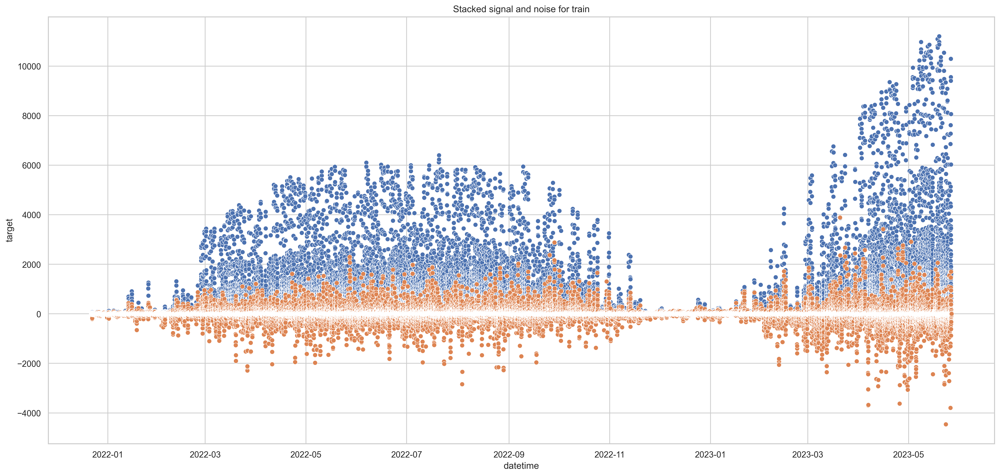

In [53]:
aux_df = y_prvt[['datetime', 'target', 'noise']].copy()

plt.figure(figsize=(22,10),dpi=300)
plt.title('Stacked signal and noise for train')
sns.scatterplot(aux_df, x = 'datetime', y = 'target')
sns.scatterplot(aux_df, x = 'datetime', y = 'noise')
plt.show()

In [54]:
print("Contribution to the total MAE:", cont_mae_full_buss + cont_mae_full_prvt)
print("Contribution to the MAE on validation set:", cont_mae_val_buss + cont_mae_val_prvt)

Contribution to the total MAE: 13.319699000513332
Contribution to the MAE on validation set: 18.25872445540397


In [55]:
cont_mae_val_buss = mean_absolute_error(y_buss[y_buss.datetime<=pd.to_datetime('2023-05-20')].target, y_buss[y_buss.datetime<=pd.to_datetime('2023-05-20')].target_predicted)*data_buss_df[data_buss_df.datetime<=pd.to_datetime('2023-05-20')].target.size/(2*data_df[data_df.date<=pd.to_datetime('2023-05-20')].target.size)

print("Contribution to the MAE on validation set:", cont_mae_val_buss)

cont_mae_val_prvt = mean_absolute_error(y_prvt[y_prvt.datetime<=pd.to_datetime('2023-05-20')].target, y_prvt[y_prvt.datetime<=pd.to_datetime('2023-05-20')].target_predicted)*data_prvt_df[data_prvt_df.datetime<=pd.to_datetime('2023-05-20')].target.size/(2*data_df[data_df.date<=pd.to_datetime('2023-05-20')].target.size)

print("Contribution to the MAE on validation set:", cont_mae_val_prvt)

print("Contribution to the MAE on validation set:", cont_mae_val_buss + cont_mae_val_prvt)

Contribution to the MAE on validation set: 6.908903607982106
Contribution to the MAE on validation set: 5.965335957845718
Contribution to the MAE on validation set: 12.874239565827825
